## Annotation

In [1]:
import warnings

warnings.filterwarnings("ignore", category=DeprecationWarning)

import numba
from numba.core.errors import NumbaDeprecationWarning, NumbaPendingDeprecationWarning

warnings.simplefilter("ignore", category=NumbaDeprecationWarning)

In [2]:
import scanpy as sc
import pandas as pd
import numpy as np
import os
import scipy
from scipy.sparse import csr_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import celltypist
from celltypist import models
import scarches as sca
import urllib.request
import anndata as ad

In order to use sagenet models, please install pytorch geometric (see https://pytorch-geometric.readthedocs.io) and 
 captum (see https://github.com/pytorch/captum).
mvTCR is not installed. To use mvTCR models, please install it first using "pip install mvtcr"
multigrate is not installed. To use multigrate models, please install it first using "pip install multigrate".


In [3]:
warnings.filterwarnings("ignore", category=pd.errors.PerformanceWarning)

In [4]:
os.environ['PYTHONHASHSEED'] = '0'

In [5]:
sc.set_figure_params(figsize=(5, 5))

In [24]:
#adata3B.obs.to_csv("sample_3B/obs_annotation3B.csv")

Intronic content visualization

In [6]:
def intronic_content_umap(adata,intronic_file):
    
    intronic_file.set_index(intronic_file["X"], inplace=True)
    
    adata.obs["intron_prop"] = intronic_file["nf"]
    adata.obs["intron_label"] = intronic_file["cell_status"]
    
    sc.pl.umap(
    adata,
    color=["celltypist_cell_label_coarse", "intron_prop", "MALAT1", "intron_label", "scDblFinder_class"],
    )

In [52]:
adata3B = sc.read(
    filename="sample_3B/sample3B_annotation.h5ad")

... storing 'intron_label' as categorical


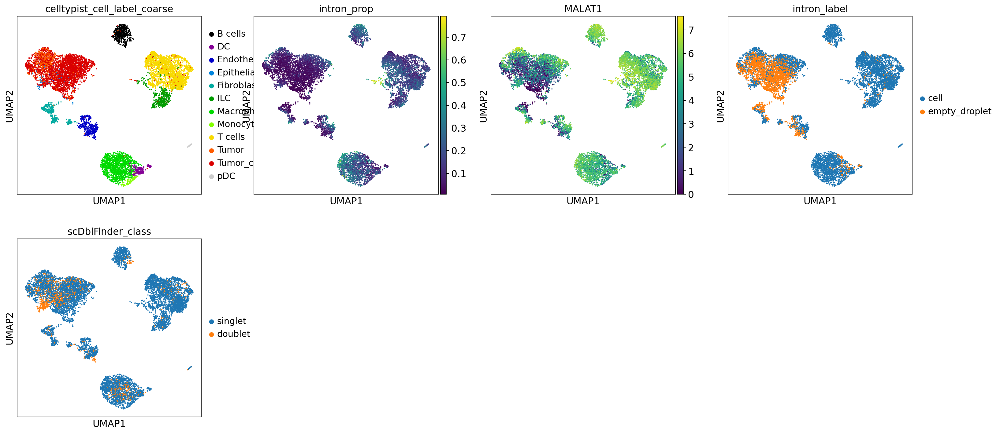

In [53]:
intronic_content_umap(adata3B,pd.read_csv("~/meso2/intronic_result_3B.csv"))

In [31]:
adata26 = sc.read(
    filename="sample_26/sample26_annotation.h5ad")

... storing 'intron_label' as categorical


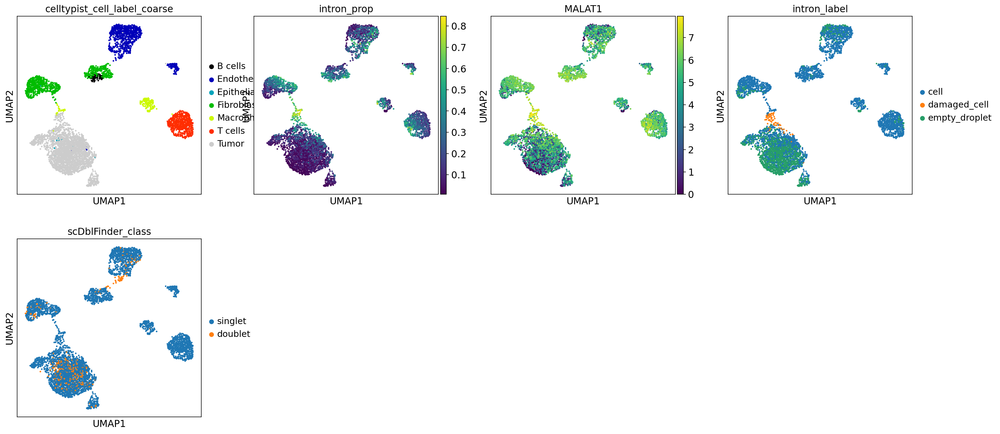

In [54]:
intronic_content_umap(adata26,pd.read_csv("~/meso2/intronic_result_26.csv"))

In [33]:
adata27 = sc.read(
    filename="sample_27/sample27_annotation.h5ad")

... storing 'intron_label' as categorical


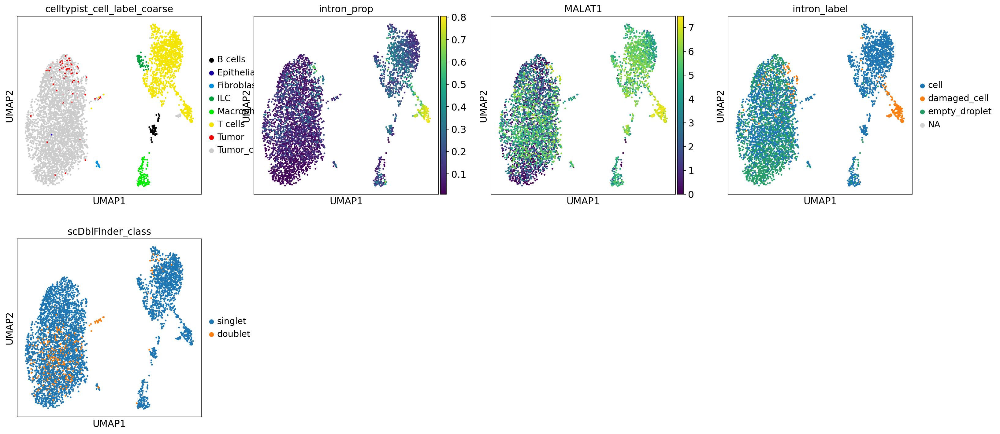

In [55]:
intronic_content_umap(adata27,pd.read_csv("~/meso2/intronic_result_27.csv"))

In [35]:
adata36 = sc.read(
    filename="sample_36/sample36_annotation.h5ad")

... storing 'intron_label' as categorical


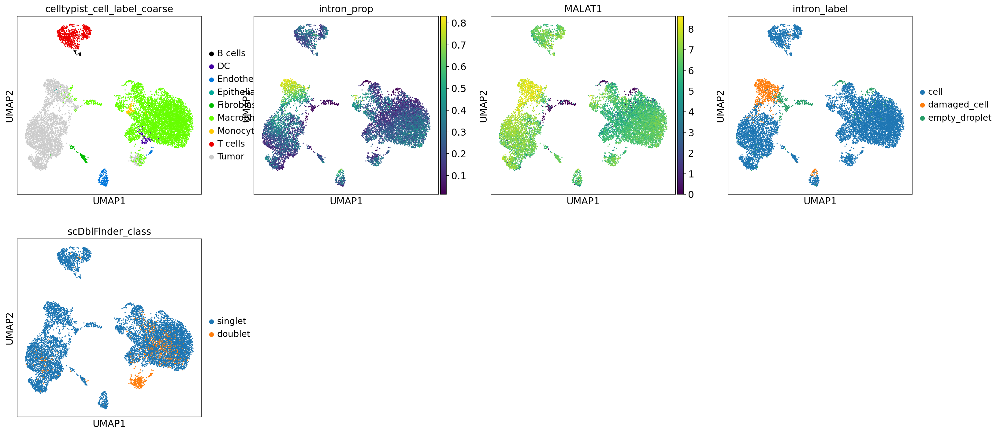

In [56]:
intronic_content_umap(adata36,pd.read_csv("~/meso2/intronic_result_36.csv"))

#######

In [38]:
## getting annotation database

models.download_models(
    force_update=True, model=["Immune_All_Low.pkl", "Immune_All_High.pkl", "Human_Lung_Atlas.pkl"]
)

model_low = models.Model.load(model="Immune_All_Low.pkl")
model_high = models.Model.load(model="Immune_All_High.pkl")
model_lung = models.Model.load(model="Human_Lung_Atlas.pkl")

print(model_high.cell_types)

print(model_low.cell_types)

print(model_lung.cell_types)

📜 Retrieving model list from server https://celltypist.cog.sanger.ac.uk/models/models.json
📚 Total models in list: 52
📂 Storing models in /home/mangel/.celltypist/data/models
💾 Total models to download: 3
💾 Downloading model [1/3]: Immune_All_Low.pkl
💾 Downloading model [2/3]: Immune_All_High.pkl
💾 Downloading model [3/3]: Human_Lung_Atlas.pkl


['B cells' 'B-cell lineage' 'Cycling cells' 'DC' 'DC precursor'
 'Double-negative thymocytes' 'Double-positive thymocytes' 'ETP'
 'Early MK' 'Endothelial cells' 'Epithelial cells' 'Erythrocytes'
 'Erythroid' 'Fibroblasts' 'Granulocytes' 'HSC/MPP' 'ILC' 'ILC precursor'
 'MNP' 'Macrophages' 'Mast cells' 'Megakaryocyte precursor'
 'Megakaryocytes/platelets' 'Mono-mac' 'Monocyte precursor' 'Monocytes'
 'Myelocytes' 'Plasma cells' 'Promyelocytes' 'T cells' 'pDC'
 'pDC precursor']
['Age-associated B cells' 'Alveolar macrophages' 'B cells'
 'CD16+ NK cells' 'CD16- NK cells' 'CD8a/a' 'CD8a/b(entry)' 'CMP'
 'CRTAM+ gamma-delta T cells' 'Classical monocytes' 'Cycling B cells'
 'Cycling DCs' 'Cycling NK cells' 'Cycling T cells'
 'Cycling gamma-delta T cells' 'Cycling monocytes' 'DC' 'DC precursor'
 'DC1' 'DC2' 'DC3' 'Double-negative thymocytes'
 'Double-positive thymocytes' 'ELP' 'ETP' 'Early MK' 'Early erythroid'
 'Early lymphoid/T lymphoid' 'Endothelial cells' 'Epithelial cells'
 'Erythrocytes'

In [42]:
def map_annotation(cell_type):
    if "tumor" in cell_type.lower() : # Checks if "tumor" is in the string, case-insensitive
        return "tumor"
    elif any(immune in cell_type.lower() for immune in ["t cells", "b cells", "macrophages", "dc", "monocytes","ilc"]):
        return "immune"
    elif any(stromal in cell_type.lower() for stromal in ["fibroblast", "endothelial"]):
        return "stromal"
    else:
        return "unknown"  

In [43]:
def annot_cells(adata):
    
    np.random.seed(0)
    
    sc.tl.leiden(adata, resolution=2, key_added="leiden_res2")
    
    #sc.pl.umap(adata, color="leiden_res2", legend_loc="on data")
    
    adata_celltypist = adata.copy()  # make a copy of our adata
    adata_celltypist.X = adata.layers["counts"]  # set adata.X to raw counts
    sc.pp.normalize_per_cell(
        adata_celltypist, counts_per_cell_after=10**4
    )  # normalize to 10,000 counts per cell
    sc.pp.log1p(adata_celltypist)  # log-transform
    # make .X dense instead of sparse, for compatibility with celltypist:
    adata_celltypist.X = adata_celltypist.X.toarray()
    
    predictions_high = celltypist.annotate(
    adata_celltypist, model=model_high, majority_voting=True
    )
    
    predictions_high_adata = predictions_high.to_adata()
    
    adata.obs["celltypist_cell_label_coarse"] = predictions_high_adata.obs.loc[
        adata.obs.index, "majority_voting"
    ]
    adata.obs["celltypist_conf_score_coarse"] = predictions_high_adata.obs.loc[
        adata.obs.index, "conf_score"
    ]
    
    predictions_low = celltypist.annotate(
    adata_celltypist, model=model_low, majority_voting=True
    )
    
    predictions_low_adata = predictions_low.to_adata()
    
    adata.obs["celltypist_cell_label_fine"] = predictions_low_adata.obs.loc[
        adata.obs.index, "majority_voting"
    ]
    adata.obs["celltypist_conf_score_fine"] = predictions_low_adata.obs.loc[
        adata.obs.index, "conf_score"
    ]
    
    sc.pl.umap(
    adata,
    color=["celltypist_cell_label_coarse", "celltypist_conf_score_coarse"],
    frameon=False,
    sort_order=False,
    wspace=1,
    )
    
    sc.pl.umap(
    adata,
    color=["celltypist_cell_label_fine", "celltypist_conf_score_fine"],
    frameon=False,
    sort_order=False,
    wspace=1,
    )

    sc.pl.dendrogram(adata, groupby="celltypist_cell_label_fine")
    
    return adata
    

In [44]:
def annot_tumor_groups(adata,file):

    adata.obs['celltypist_cell_label_coarse'] = file.iloc[:, 2].values

    adata.obs.loc[adata.obs['celltypist_cell_label_coarse'].str.contains('Tumor'), 'celltypist_conf_score_coarse'] = pd.NA

    sc.pl.umap(
        adata,
        color=["celltypist_cell_label_coarse", "celltypist_conf_score_coarse"],
        frameon=False,
        sort_order=False,
        wspace=1,
        palette="nipy_spectral"
    )
        
    file_copy = file.copy()
    file_copy.set_index(file_copy.X,inplace=True)
    file_copy.drop(columns=["Unnamed: 0","X"],inplace=True)
    adata.obs["is_tumor"] = file_copy["celltypist_cell_label_coarse"].str.startswith('Tumor')
    
    adata.obs["annotation_group"] = adata.obs["celltypist_cell_label_coarse"].apply(map_annotation)
    
    return adata

In [45]:
def get_tumor(adata,file):
    
    file_copy = file.copy()
    file_copy.set_index(file_copy.X,inplace=True)
    file_copy.drop(columns=["Unnamed: 0","X"],inplace=True)
    adata_tumor = adata[adata.obs.is_tumor == True]
    adata_tumor.obs["annot"] = file_copy["celltypist_cell_label_coarse"]
    
    return adata_tumor
    

In [46]:
adata3B = sc.read(
    filename="sample_3B/sample3B_clustered.h5ad")

In [47]:
adata26 = sc.read(
    filename="sample_26/sample26_clustered.h5ad")

In [48]:
adata27 = sc.read(
    filename="sample_27/sample27_clustered.h5ad")

In [49]:
adata35 = sc.read(
    filename="sample_35/sample35_clustered.h5ad")

In [50]:
adata36 = sc.read(
    filename="sample_36/sample36_clustered.h5ad")

In [51]:
adataTICP32 = sc.read(
    filename="sample_TICP32/sampleTICP32_clustered.h5ad")

## Automated cell annotation

### Classifiers based on a wider set of genes

🔬 Input data has 8933 cells and 17710 genes
🔗 Matching reference genes in the model
🧬 5452 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 10
🗳️ Majority voting the predictions
✅ Majority voting done!
🔬 Input data has 8933 cells and 17710 genes
🔗 Matching reference genes in the model
🧬 5452 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 10
🗳️ Majority voting the predictions
✅ Majority voting done!


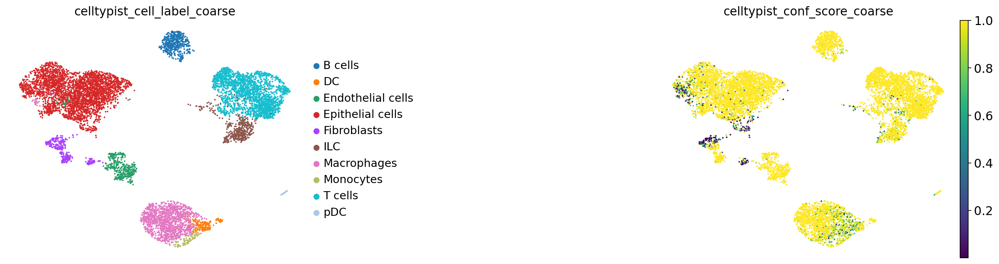

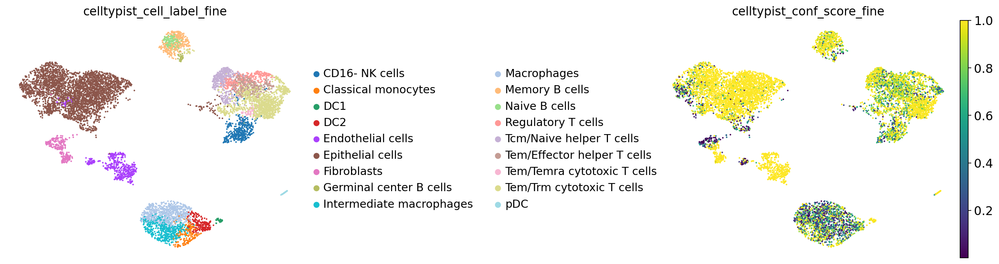

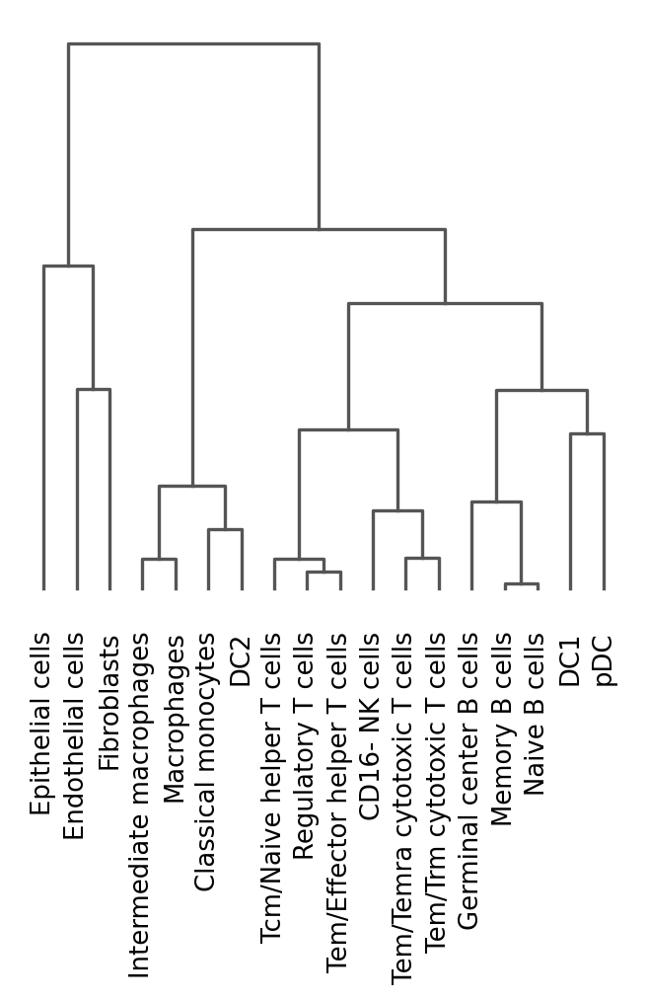

In [52]:
adata3B = annot_cells(adata3B)

🔬 Input data has 5432 cells and 16759 genes
🔗 Matching reference genes in the model
🧬 5112 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 10
🗳️ Majority voting the predictions
✅ Majority voting done!
🔬 Input data has 5432 cells and 16759 genes
🔗 Matching reference genes in the model
🧬 5112 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 10
🗳️ Majority voting the predictions
✅ Majority voting done!


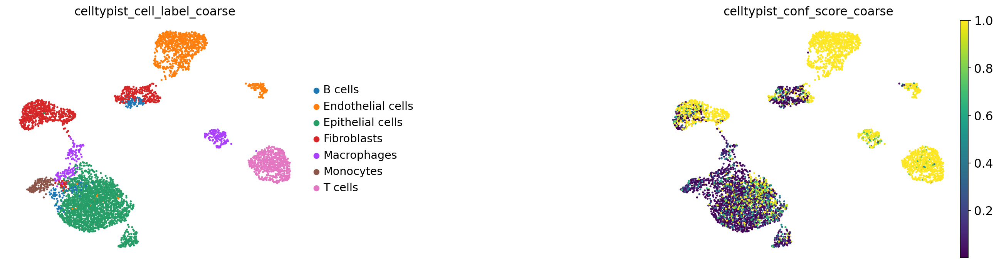

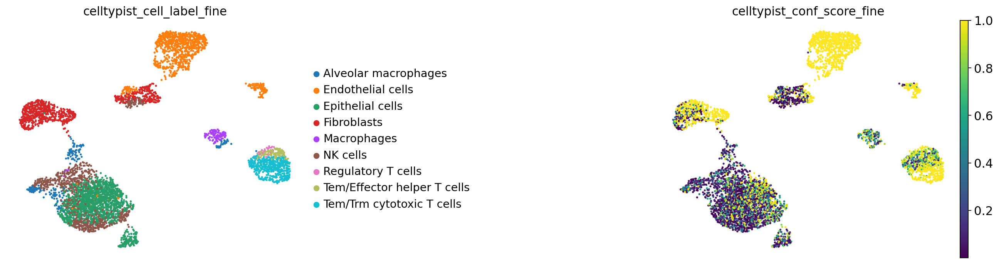

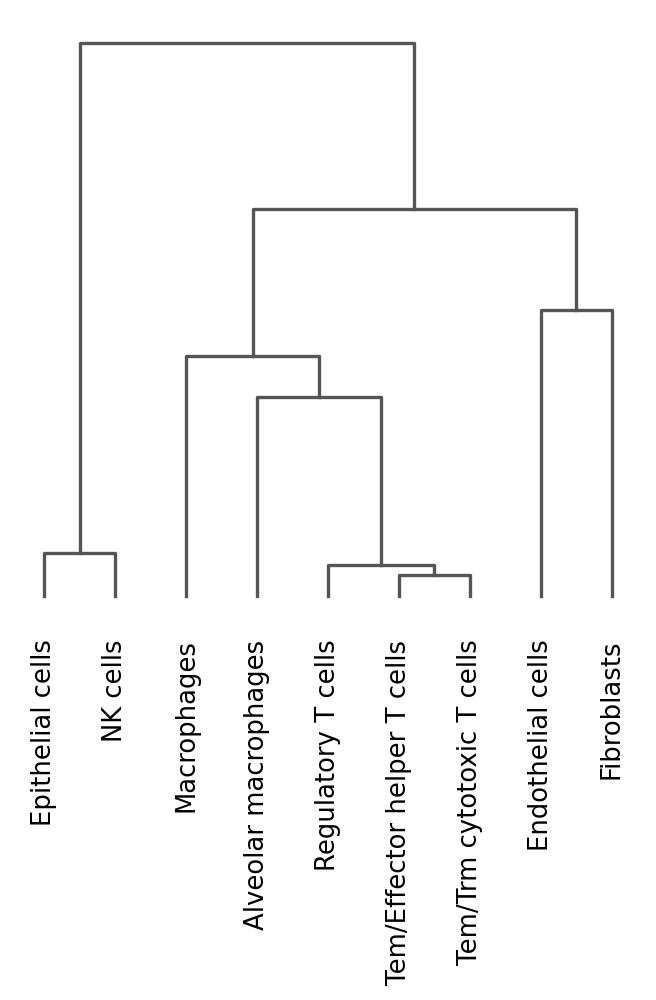

In [53]:
adata26 = annot_cells(adata26)

🔬 Input data has 4721 cells and 15568 genes
🔗 Matching reference genes in the model
🧬 4852 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 5
🗳️ Majority voting the predictions
✅ Majority voting done!
🔬 Input data has 4721 cells and 15568 genes
🔗 Matching reference genes in the model
🧬 4852 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 5
🗳️ Majority voting the predictions
✅ Majority voting done!


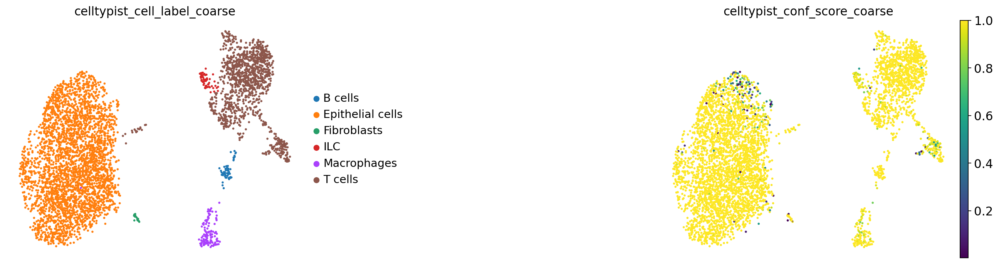

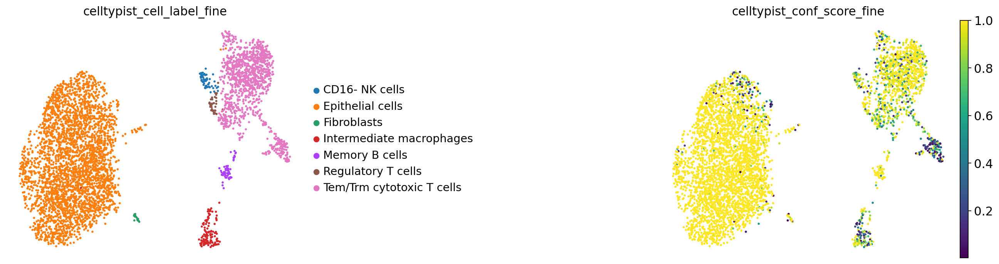

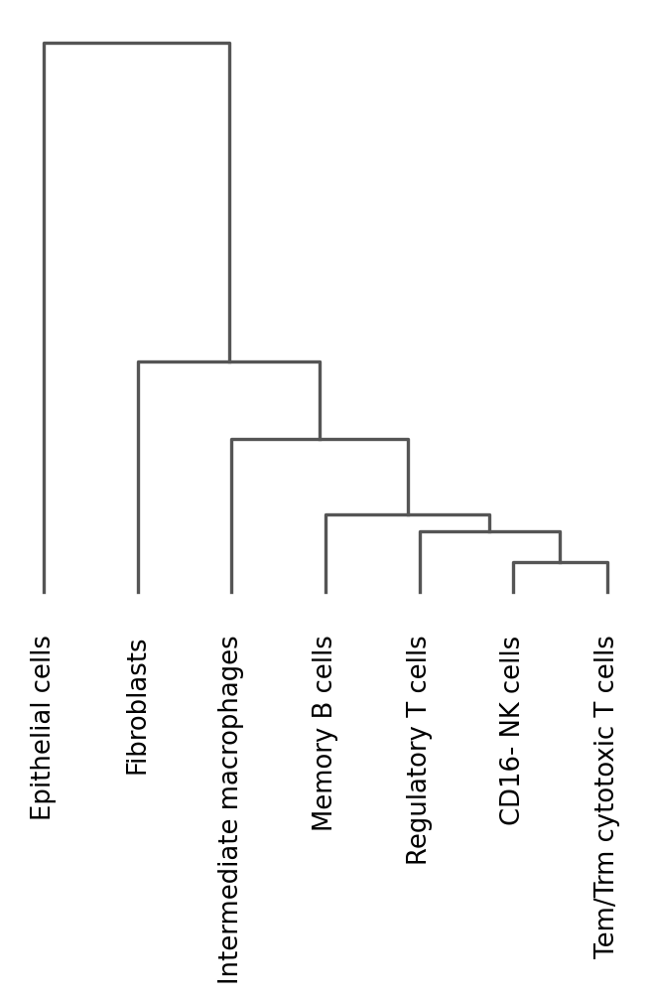

In [54]:
adata27 = annot_cells(adata27)

🔬 Input data has 779 cells and 441 genes
🔗 Matching reference genes in the model
🧬 382 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 5


🗳️ Majority voting the predictions
✅ Majority voting done!
🔬 Input data has 779 cells and 441 genes
🔗 Matching reference genes in the model
🧬 382 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 5
🗳️ Majority voting the predictions
✅ Majority voting done!


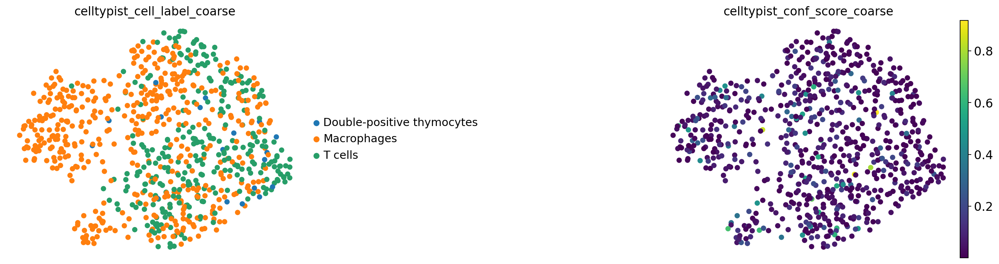

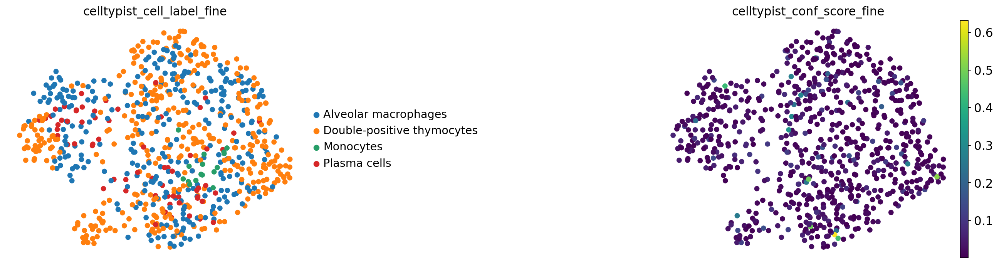

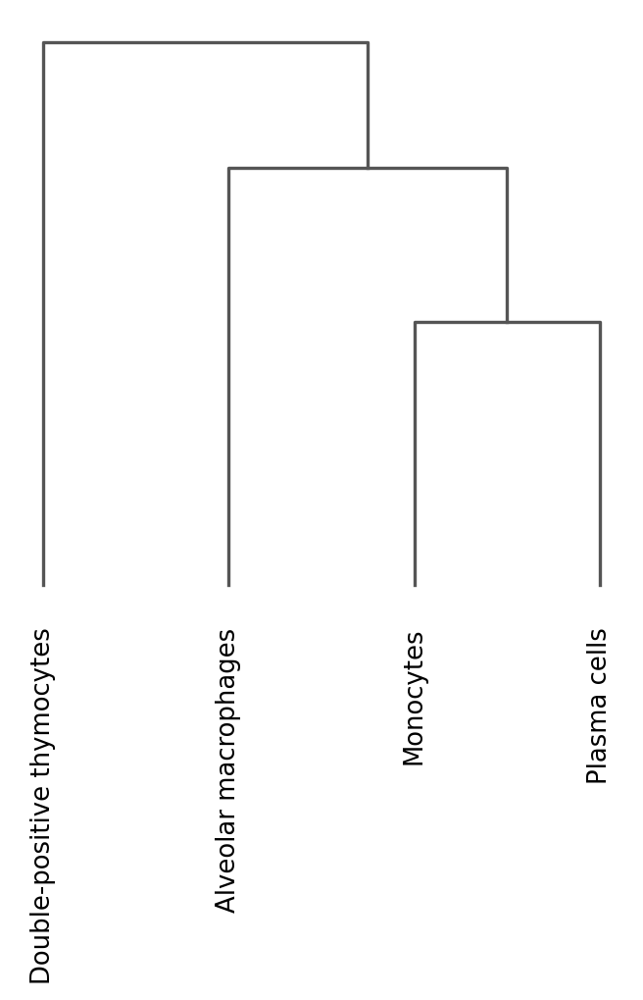

In [55]:
adata35 = annot_cells(adata35)

🔬 Input data has 9927 cells and 19964 genes
🔗 Matching reference genes in the model
🧬 5513 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 10
🗳️ Majority voting the predictions
✅ Majority voting done!
🔬 Input data has 9927 cells and 19964 genes
🔗 Matching reference genes in the model
🧬 5513 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 10
🗳️ Majority voting the predictions
✅ Majority voting done!


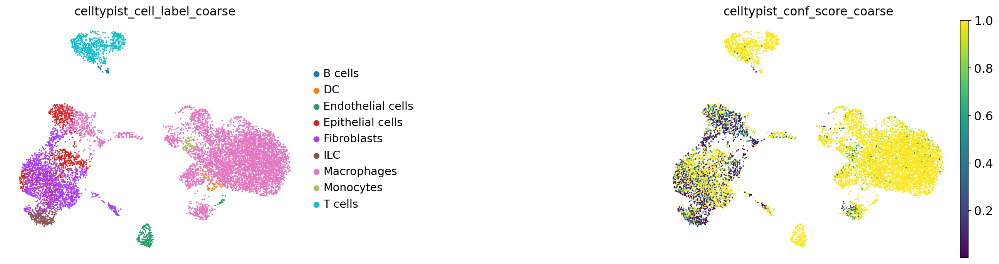

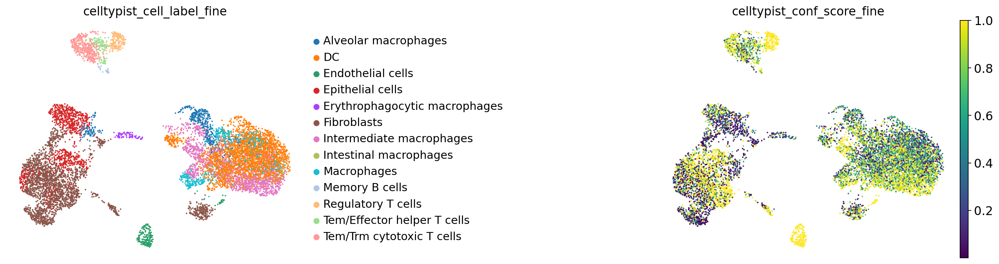

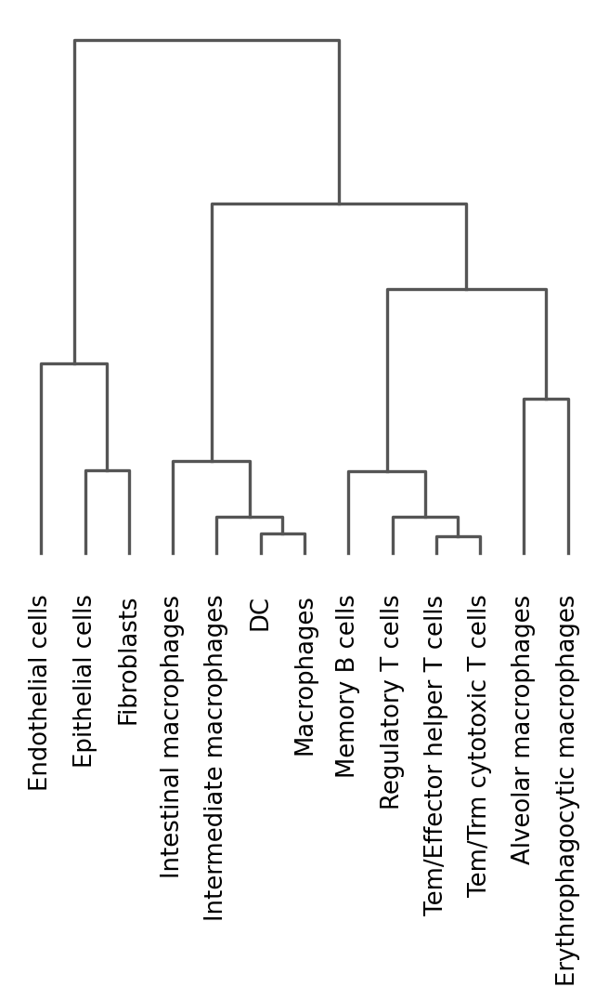

In [56]:
adata36 = annot_cells(adata36)

🔬 Input data has 468 cells and 11766 genes
🔗 Matching reference genes in the model


🧬 4136 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 5
🗳️ Majority voting the predictions
✅ Majority voting done!
🔬 Input data has 468 cells and 11766 genes
🔗 Matching reference genes in the model
🧬 4136 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 5
🗳️ Majority voting the predictions
✅ Majority voting done!


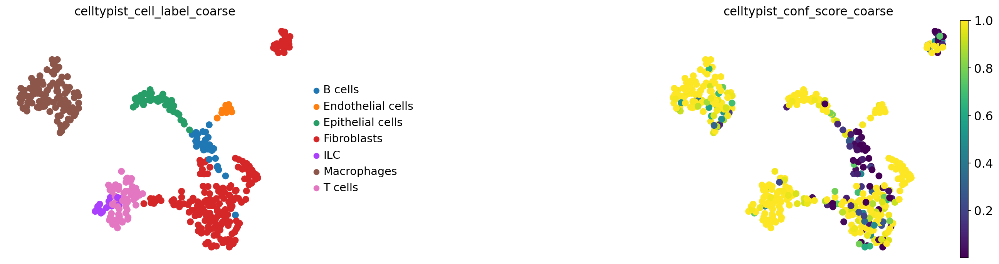

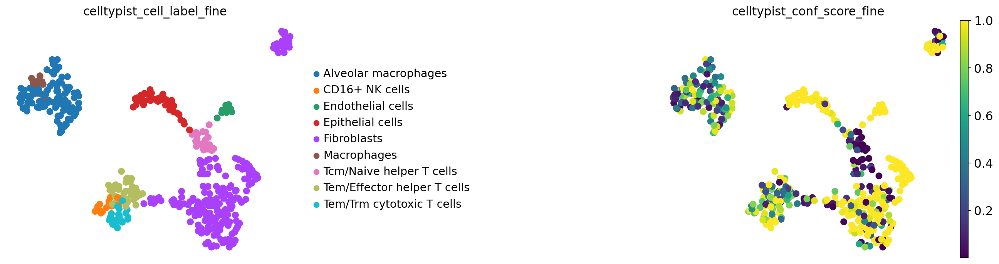

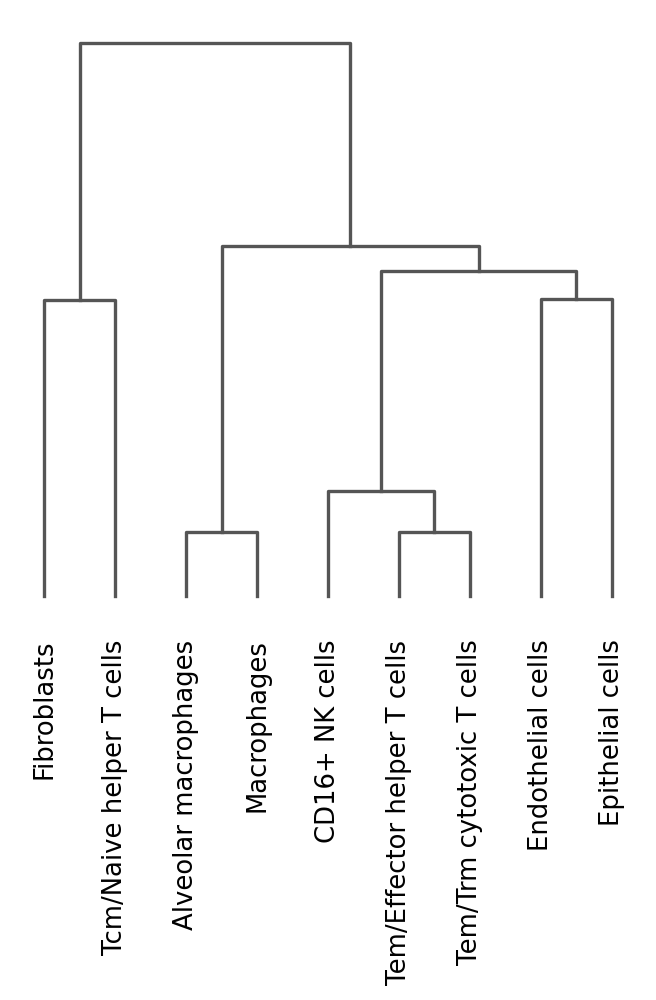

In [57]:
adataTICP32 = annot_cells(adataTICP32)

In [58]:
# for abstract figure & tumor annotation

adata3B.obs['celltypist_cell_label_coarse'].to_csv("sample_3B/annot3B.csv")
adata26.obs['celltypist_cell_label_coarse'].to_csv("sample_26/annot26.csv")
adata27.obs['celltypist_cell_label_coarse'].to_csv("sample_27/annot27.csv")
adata35.obs['celltypist_cell_label_coarse'].to_csv("sample_35/annot35.csv")
adata36.obs['celltypist_cell_label_coarse'].to_csv("sample_36/annot36.csv")
adataTICP32.obs['celltypist_cell_label_coarse'].to_csv("sample_TICP32/annotTICP32.csv")

## Add tumor cell annotation (from Numbat) & groups (tumor,stromal,immune)

import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline

adata3B = sc.read(
    filename="sample_3B/sample3B_annotation.h5ad")

sc.pl.umap(
adata3B,
color=["celltypist_cell_label_coarse", "celltypist_conf_score_coarse"],
frameon=False,
sort_order=False,
wspace=1,
palette="nipy_spectral",
save='umap_annot_withconfscore_3B.svg'
)

#plt.savefig("sample_3B/umap_annot_withconfscore_3B.svg", format="svg")
#plt.show()

... storing 'celltypist_cell_label_coarse' as categorical


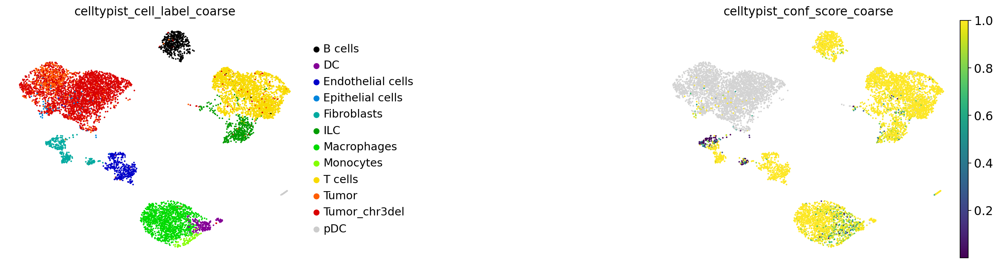

In [59]:
file3B = pd.read_csv("sample_3B/annot3B_tumor.csv")

adata3B = annot_tumor_groups(adata3B, file3B)

In [60]:
adata3B.obs

,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_20_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,total_counts_ribo,log1p_total_counts_ribo,...,leiden_res0_25,leiden_res0_5,leiden_res1,leiden_res2,celltypist_cell_label_coarse,celltypist_conf_score_coarse,celltypist_cell_label_fine,celltypist_conf_score_fine,is_tumor,annotation_group
AAACCCAAGATCCTAC-1,829,6.721426,2192.0,7.693026,30.656934,47.0,3.871201,2.144161,498.0,6.212606,...,0,8,12,17,T cells,0.999987,Tem/Trm cytotoxic T cells,0.870735,False,immune
AAACCCAAGATGAATC-1,2815,7.943073,8118.0,9.001963,20.140429,289.0,5.669881,3.559990,1448.0,7.278629,...,1,0,7,15,Tumor,NaN,Epithelial cells,0.981634,True,tumor
AAACCCAAGGCCACCT-1,2566,7.850493,9765.0,9.186663,18.044035,219.0,5.393628,2.242703,2766.0,7.925519,...,5,6,9,14,Endothelial cells,1.000000,Endothelial cells,1.000000,False,stromal
AAACCCAAGGTAGATT-1,892,6.794587,1610.0,7.384610,18.819876,25.0,3.258096,1.552795,288.0,5.666427,...,6,7,10,8,ILC,0.999328,CD16- NK cells,0.875485,False,immune
AAACCCAAGTGCACCC-1,4704,8.456381,30094.0,10.312115,32.096099,931.0,6.837333,3.093640,5658.0,8.641003,...,3,2,3,2,Tumor_chr3del,NaN,Epithelial cells,1.000000,True,tumor
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGTCAGTCTTT-1,970,6.878326,2822.0,7.945556,25.690999,40.0,3.713572,1.417434,1099.0,7.003066,...,0,3,0,1,T cells,0.999982,Tem/Effector helper T cells,0.739062,False,immune
TTTGTTGTCCAAACCA-1,1565,7.356280,4539.0,8.420682,17.536902,243.0,5.497168,5.353602,1016.0,6.924613,...,1,0,7,18,Tumor_chr3del,NaN,Epithelial cells,0.999960,True,tumor
TTTGTTGTCCTTATAC-1,859,6.756932,2282.0,7.733246,22.874671,40.0,3.713572,1.752848,742.0,6.610696,...,0,4,4,0,T cells,0.999989,Tem/Trm cytotoxic T cells,0.999996,False,immune
TTTGTTGTCGACATAC-1,2734,7.913887,14860.0,9.606496,19.798116,3.0,1.386294,0.020188,3902.0,8.269501,...,3,2,3,20,Tumor_chr3del,NaN,Epithelial cells,0.999999,True,tumor


... storing 'celltypist_cell_label_coarse' as categorical


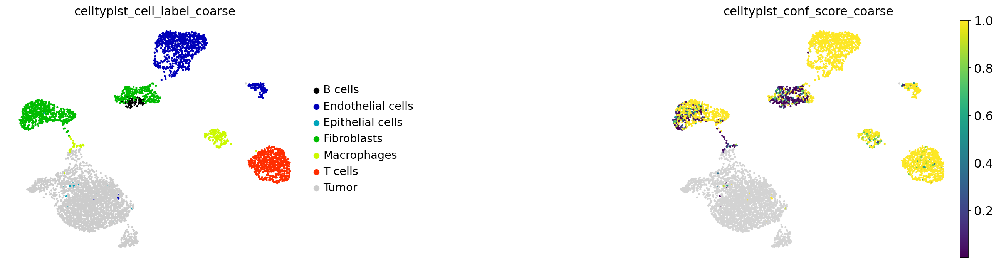

In [61]:
file26 = pd.read_csv("sample_26/annot26_tumor.csv")

adata26 = annot_tumor_groups(adata26,file26)

In [62]:
adata26.obs

,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_20_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,total_counts_ribo,log1p_total_counts_ribo,...,leiden_res0_25,leiden_res0_5,leiden_res1,leiden_res2,celltypist_cell_label_coarse,celltypist_conf_score_coarse,celltypist_cell_label_fine,celltypist_conf_score_fine,is_tumor,annotation_group
AAACCCAAGACGCAGT-1,416,6.033086,724.0,6.586172,26.795580,67.0,4.219508,9.254144,182.0,5.209486,...,2,3,1,0,T cells,0.308657,Tem/Trm cytotoxic T cells,0.695335,False,immune
AAACCCAAGACTACGG-1,3569,8.180321,16680.0,9.722026,17.883693,553.0,6.317165,3.315348,5576.0,8.626407,...,0,1,0,10,Tumor,NaN,Epithelial cells,0.159488,True,tumor
AAACCCAAGTCCCGGT-1,7548,8.929170,69740.0,11.152544,18.187554,1357.0,7.213768,1.945799,17457.0,9.767553,...,0,0,0,19,Tumor,NaN,Epithelial cells,0.954029,True,tumor
AAACCCAAGTTGCCTA-1,1187,7.080026,2492.0,7.821242,19.181380,91.0,4.521789,3.651685,382.0,5.948035,...,2,3,1,14,T cells,0.989873,Tem/Trm cytotoxic T cells,0.661303,False,immune
AAACCCAGTGAGAGGG-1,2214,7.703008,7381.0,8.906800,20.891478,261.0,5.568345,3.536106,1964.0,7.583248,...,0,0,0,10,Tumor,NaN,Epithelial cells,0.001973,True,tumor
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGAGTAAACGT-1,1537,7.338238,3601.0,8.189244,22.216051,456.0,6.124683,12.663150,621.0,6.432940,...,4,5,5,16,Tumor,NaN,NK cells,0.030578,True,tumor
TTTGTTGCATTCAGGT-1,4619,8.438150,23538.0,10.066414,14.992778,483.0,6.182085,2.052001,5462.0,8.605753,...,0,1,8,8,Tumor,NaN,NK cells,0.566198,True,tumor
TTTGTTGGTCAGGAGT-1,4171,8.336151,18478.0,9.824390,22.405022,687.0,6.533789,3.717935,4384.0,8.385945,...,0,0,0,19,Tumor,NaN,Epithelial cells,0.863979,True,tumor
TTTGTTGTCAGACCTA-1,4357,8.379769,20113.0,9.909171,15.666484,881.0,6.782192,4.380251,4260.0,8.357259,...,4,5,5,7,Tumor,NaN,NK cells,0.118057,True,tumor


... storing 'celltypist_cell_label_coarse' as categorical


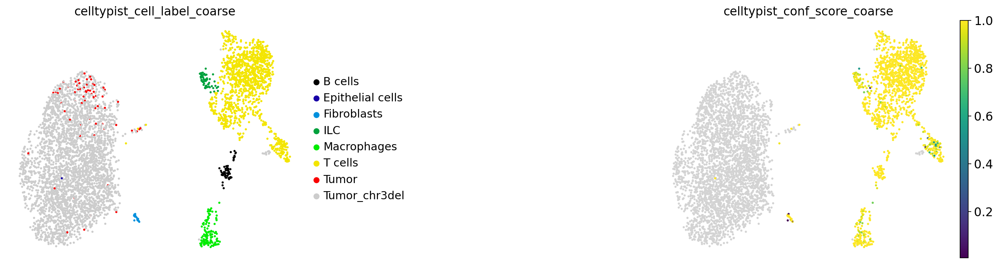

In [63]:
file27 = pd.read_csv("sample_27/annot27_tumor.csv")

adata27 = annot_tumor_groups(adata27,file27)

In [64]:
adata27.obs.head()

,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_20_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,total_counts_ribo,log1p_total_counts_ribo,...,leiden_res0_25,leiden_res0_5,leiden_res1,leiden_res2,celltypist_cell_label_coarse,celltypist_conf_score_coarse,celltypist_cell_label_fine,celltypist_conf_score_fine,is_tumor,annotation_group
AAACCCAAGACCAAAT-1,2132,7.665285,4735.0,8.462948,19.303062,365.0,5.902633,7.708553,628.0,6.444131,...,1,0,6,6,Tumor_chr3del,NaN,Epithelial cells,0.999997,True,tumor
AAACCCAAGAGAGCAA-1,2128,7.663408,5070.0,8.531293,13.471400,253.0,5.537334,4.990138,741.0,6.609349,...,0,1,6,6,Tumor_chr3del,NaN,Epithelial cells,0.241293,True,tumor
AAACCCAAGCAGCCTC-1,5630,8.636042,29103.0,10.278631,14.826650,621.0,6.432940,2.133801,4703.0,8.456168,...,0,1,8,7,Tumor_chr3del,NaN,Epithelial cells,1.000000,True,tumor
AAACCCAAGCGTCAAG-1,2589,7.859413,7493.0,8.921858,16.762311,233.0,5.455321,3.109569,1764.0,7.475906,...,0,1,1,8,Tumor_chr3del,NaN,Epithelial cells,0.999997,True,tumor
AAACCCACACGACCTG-1,1459,7.286192,3836.0,8.252446,22.992701,177.0,5.181784,4.614182,957.0,6.864848,...,2,2,0,0,T cells,1.0,Tem/Trm cytotoxic T cells,0.272915,False,immune


... storing 'celltypist_cell_label_coarse' as categorical


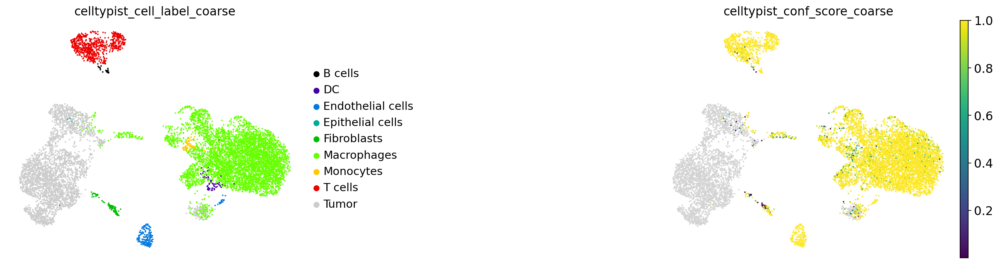

In [65]:
file36 = pd.read_csv("sample_36/annot36_tumor.csv")

adata36 = annot_tumor_groups(adata36,file36)

In [66]:
adata36.obs.head()

,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_20_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,total_counts_ribo,log1p_total_counts_ribo,...,leiden_res0_25,leiden_res0_5,leiden_res1,leiden_res2,celltypist_cell_label_coarse,celltypist_conf_score_coarse,celltypist_cell_label_fine,celltypist_conf_score_fine,is_tumor,annotation_group
AAACCCAAGAATTTGG-1,2225,7.707962,5828.0,8.670601,26.424159,526.0,6.267200,9.025394,653.0,6.483108,...,1,1,3,0,Tumor,NaN,Fibroblasts,0.103066,True,tumor
AAACCCAAGCACACCC-1,3145,8.053887,11911.0,9.385302,24.615901,927.0,6.833032,7.782722,638.0,6.459905,...,0,0,2,19,Macrophages,0.999593,DC,0.948813,False,immune
AAACCCAAGGCTATCT-1,1566,7.356918,3750.0,8.229777,23.600000,133.0,4.897840,3.546667,700.0,6.552508,...,3,5,14,20,T cells,1.000000,Regulatory T cells,0.999711,False,immune
AAACCCACACATGACT-1,4477,8.406932,18576.0,9.829679,25.866710,858.0,6.755769,4.618863,1905.0,7.552762,...,1,1,4,1,Tumor,NaN,Fibroblasts,0.927510,True,tumor
AAACCCACAGCGTGAA-1,2794,7.935587,9307.0,9.138630,21.456968,164.0,5.105946,1.762115,669.0,6.507277,...,0,3,9,19,Macrophages,0.999941,Macrophages,0.941031,False,immune


... storing 'celltypist_cell_label_coarse' as categorical
... storing 'annotation_group' as categorical


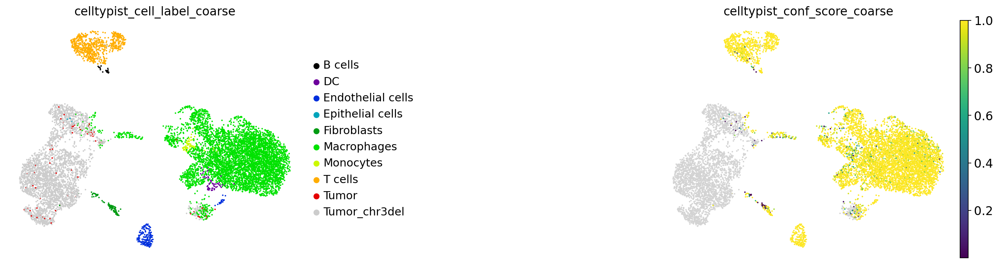

In [67]:
file36_BAP1 = pd.read_csv("sample_36/annot36_BAP1_tumor.csv")

adata36_BAP1 = adata36.copy()

adata36_BAP1 = annot_tumor_groups(adata36_BAP1,file36_BAP1)

... storing 'celltypist_cell_label_coarse' as categorical
... storing 'annotation_group' as categorical


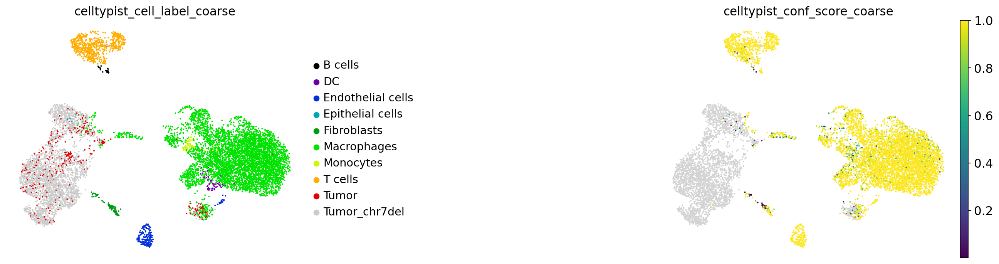

In [68]:
file36_EZH2 = pd.read_csv("sample_36/annot36_EZH2_tumor.csv")

adata36_EZH2 = adata36.copy()

adata36_EZH2 = annot_tumor_groups(adata36_EZH2,file36_EZH2)

... storing 'celltypist_cell_label_coarse' as categorical
... storing 'annotation_group' as categorical


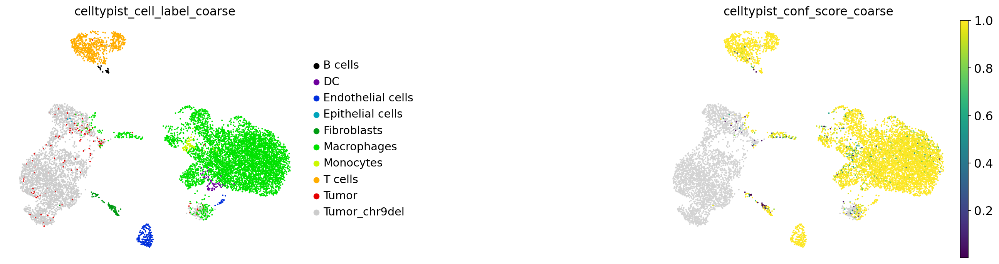

In [69]:
file36_CDKN2_MTAP = pd.read_csv("sample_36/annot36_CDKN2_MTAP_tumor.csv")

adata36_CDKN2_MTAP = adata36.copy()

adata36_CDKN2_MTAP = annot_tumor_groups(adata36_CDKN2_MTAP,file36_CDKN2_MTAP)

... storing 'celltypist_cell_label_coarse' as categorical
... storing 'annotation_group' as categorical


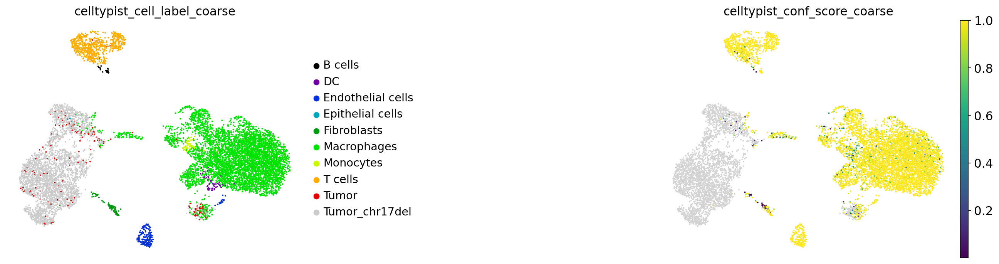

In [70]:
file36_TP53 = pd.read_csv("sample_36/annot36_TP53_tumor.csv")

adata36_TP53 = adata36.copy()

adata36_TP53 = annot_tumor_groups(adata36_TP53,file36_TP53)

... storing 'celltypist_cell_label_coarse' as categorical
... storing 'annotation_group' as categorical


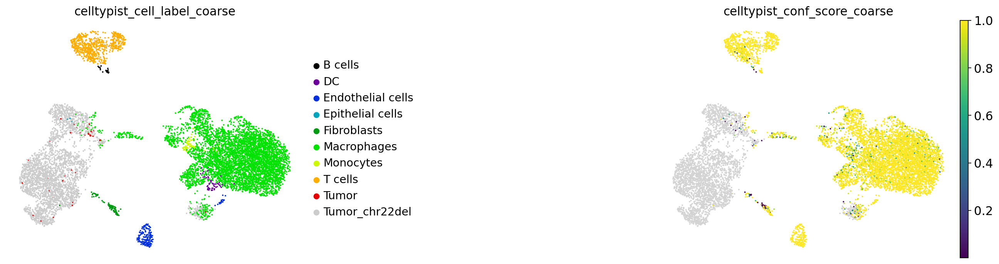

In [71]:
file36_NF2 = pd.read_csv("sample_36/annot36_NF2_tumor.csv")

adata36_NF2 = adata36.copy()

adata36_NF2 = annot_tumor_groups(adata36_NF2,file36_NF2)

In [72]:
all_annots = pd.concat([file36_BAP1.celltypist_cell_label_coarse,file36_EZH2.celltypist_cell_label_coarse,file36_CDKN2_MTAP.celltypist_cell_label_coarse,file36_TP53.celltypist_cell_label_coarse,file36_NF2.celltypist_cell_label_coarse],axis=1)

In [73]:
all_annots

,celltypist_cell_label_coarse,celltypist_cell_label_coarse,celltypist_cell_label_coarse,celltypist_cell_label_coarse,celltypist_cell_label_coarse
0,Tumor,Tumor_chr7del,Tumor_chr9del,Tumor_chr17del,Tumor_chr22del
1,Macrophages,Macrophages,Macrophages,Macrophages,Macrophages
2,T cells,T cells,T cells,T cells,T cells
3,Tumor_chr3del,Tumor_chr7del,Tumor_chr9del,Tumor_chr17del,Tumor_chr22del
4,Macrophages,Macrophages,Macrophages,Macrophages,Macrophages
...,...,...,...,...,...
9922,Macrophages,Macrophages,Macrophages,Macrophages,Macrophages
9923,Tumor_chr3del,Tumor_chr7del,Tumor_chr9del,Tumor_chr17del,Tumor_chr22del
9924,Macrophages,Macrophages,Macrophages,Macrophages,Macrophages
9925,Macrophages,Macrophages,Macrophages,Macrophages,Macrophages


In [74]:
# Find rows where "del" is present in all columns
indexes = all_annots.apply(lambda row: all('del' in str(value) for value in row), axis=1)

# Get the index values
indexes_with_del = all_annots[indexes].index.tolist()

print(indexes_with_del)

[3, 6, 7, 8, 19, 20, 23, 26, 27, 29, 33, 37, 39, 41, 50, 51, 58, 60, 61, 65, 68, 70, 73, 74, 77, 79, 81, 82, 84, 86, 88, 97, 108, 111, 112, 116, 126, 133, 137, 139, 142, 143, 144, 145, 146, 149, 154, 155, 161, 169, 174, 183, 185, 188, 204, 210, 213, 214, 217, 219, 222, 225, 233, 236, 240, 245, 247, 250, 253, 257, 260, 263, 264, 266, 267, 271, 275, 284, 285, 293, 295, 301, 306, 310, 317, 324, 326, 327, 329, 330, 331, 337, 339, 355, 357, 363, 366, 369, 370, 376, 382, 388, 389, 392, 395, 398, 401, 406, 410, 411, 422, 431, 435, 441, 442, 446, 457, 462, 467, 472, 477, 480, 482, 483, 485, 491, 496, 501, 510, 519, 529, 534, 542, 547, 553, 554, 556, 558, 565, 575, 576, 578, 579, 588, 591, 593, 594, 596, 605, 606, 616, 618, 627, 638, 650, 651, 654, 656, 658, 662, 665, 666, 667, 676, 680, 683, 687, 690, 693, 697, 698, 706, 707, 710, 711, 721, 728, 730, 736, 738, 741, 752, 754, 757, 763, 764, 767, 768, 769, 770, 773, 774, 777, 782, 783, 799, 809, 819, 821, 828, 829, 832, 833, 834, 846, 848, 850, 

In [75]:
file36_allLosses = file36.copy()

In [76]:
file36_allLosses.loc[indexes_with_del, :] = "All_5_losses"

In [77]:
file36_allLosses.loc[12,:]

Unnamed: 0                                      13
X                               AAACGAAAGAATTTGG-1
celltypist_cell_label_coarse                 Tumor
Name: 12, dtype: object

In [78]:
adata36_allLosses = adata36.copy()

adata36_allLosses.obs['celltypist_cell_label_coarse'] = file36_allLosses.iloc[:, 2].values

adata36_allLosses.obs.loc[adata36_allLosses.obs['celltypist_cell_label_coarse'].isin(['All_5_losses']),'celltypist_conf_score_coarse'] = pd.NA

In [79]:
set(file36_allLosses.iloc[:, 2].values)
#set(adata36_allLosses.obs['celltypist_cell_label_coarse'])

{'All_5_losses',
 'B cells',
 'DC',
 'Endothelial cells',
 'Epithelial cells',
 'Fibroblasts',
 'Macrophages',
 'Monocytes',
 'T cells',
 'Tumor'}

... storing 'celltypist_cell_label_coarse' as categorical
... storing 'annotation_group' as categorical


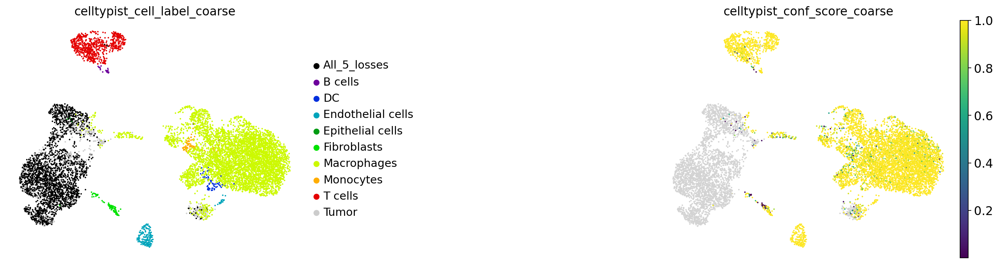

In [80]:
sc.pl.umap(
    adata36_allLosses,
    color=["celltypist_cell_label_coarse", "celltypist_conf_score_coarse"],
    frameon=False,
    sort_order=False,
    wspace=1,
    palette="nipy_spectral"
)

In [81]:
adata3B.write("sample_3B/sample3B_annotation.h5ad")

... storing 'annotation_group' as categorical


In [82]:
adata26.write("sample_26/sample26_annotation.h5ad")

... storing 'annotation_group' as categorical


In [83]:
adata27.write("sample_27/sample27_annotation.h5ad")

... storing 'annotation_group' as categorical


In [84]:
adata35.write("sample_35/sample35_annotation.h5ad")

In [85]:
adata36.write("sample_36/sample36_annotation.h5ad")

... storing 'annotation_group' as categorical


In [86]:
adata36_BAP1.write("sample_36/sample36_BAP1_annotation.h5ad")

... storing 'annotation_group' as categorical


In [87]:
adata36_EZH2.write("sample_36/sample36_EZH2_annotation.h5ad")

... storing 'annotation_group' as categorical


In [88]:
adata36_CDKN2_MTAP.write("sample_36/sample36_CDKN2_MTAP_annotation.h5ad")

... storing 'annotation_group' as categorical


In [89]:
adata36_TP53.write("sample_36/sample36_TP53_annotation.h5ad")

... storing 'annotation_group' as categorical


In [90]:
adata36_NF2.write("sample_36/sample36_NF2_annotation.h5ad")

... storing 'annotation_group' as categorical


In [91]:
adataTICP32.write("sample_TICP32/sampleTICP32_annotation.h5ad")

In [92]:
## take only genes in common between all samples

# You can create a list of these objects
adata_list = [adata3B, adata26, adata27, adata36_BAP1]

# Step 1: Identify common genes
# Get the set of genes in each AnnData object
genes_list = [set(adata.var_names) for adata in adata_list]

# Find the intersection of these sets to get the common genes
common_genes = set.intersection(*genes_list)

# Step 2: Subset each AnnData object to keep only the common genes
for i, adata in enumerate(adata_list):
    adata_list[i] = adata[:, list(common_genes)]

# Now, adata_list contains the filtered AnnData objects
adata3B, adata26, adata27, adata36_BAP1 = adata_list

# Optionally, verify the results
print(f"Number of common genes: {len(common_genes)}")
indexes = ["3B","26","27","36"]
for i, adata in enumerate(adata_list):
    print(f"adata{indexes[i]} shape: {adata.shape}")

# 14477 common genes


Number of common genes: 14477
adata3B shape: (8933, 14477)
adata26 shape: (5432, 14477)
adata27 shape: (4721, 14477)
adata36 shape: (9927, 14477)


In [93]:
# Verify that all filtered AnnData objects have the same set of gene names
common_genes = set.intersection(*(set(adata.var_names) for adata in adata_list))
for i, adata in enumerate(adata_list):
    assert set(adata.var_names) == common_genes, f"Genes in adata{indexes[i]} do not match the common genes."

# Verify that the order of gene names is the same in all AnnData objects
reference_genes = adata_list[0].var_names
for i, adata in enumerate(adata_list[1:], start=1):
    assert all(reference_genes == adata.var_names), f"Gene order in adata{indexes[i]} does not match the reference order."

print("All genes match and are in the same order across all AnnData objects.")


All genes match and are in the same order across all AnnData objects.


In [94]:
# concat all samples

obs_all_cells = ad.concat([adata3B, adata26, adata27, adata36_BAP1],axis=0,join="outer",uns_merge="same")
obs_all_cells.obs_names_make_unique()
obs_all_cells.obs

,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_20_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,total_counts_ribo,log1p_total_counts_ribo,...,leiden_res0_25,leiden_res0_5,leiden_res1,leiden_res2,celltypist_cell_label_coarse,celltypist_conf_score_coarse,celltypist_cell_label_fine,celltypist_conf_score_fine,is_tumor,annotation_group
AAACCCAAGATCCTAC-1,829,6.721426,2192.0,7.693026,30.656934,47.0,3.871201,2.144161,498.0,6.212606,...,0,8,12,17,T cells,0.999987,Tem/Trm cytotoxic T cells,0.870735,False,immune
AAACCCAAGATGAATC-1,2815,7.943073,8118.0,9.001963,20.140429,289.0,5.669881,3.559990,1448.0,7.278629,...,1,0,7,15,Tumor,NaN,Epithelial cells,0.981634,True,tumor
AAACCCAAGGCCACCT-1,2566,7.850493,9765.0,9.186663,18.044035,219.0,5.393628,2.242703,2766.0,7.925519,...,5,6,9,14,Endothelial cells,1.000000,Endothelial cells,1.000000,False,stromal
AAACCCAAGGTAGATT-1,892,6.794587,1610.0,7.384610,18.819876,25.0,3.258096,1.552795,288.0,5.666427,...,6,7,10,8,ILC,0.999328,CD16- NK cells,0.875485,False,immune
AAACCCAAGTGCACCC-1,4704,8.456381,30094.0,10.312115,32.096099,931.0,6.837333,3.093640,5658.0,8.641003,...,3,2,3,2,Tumor_chr3del,NaN,Epithelial cells,1.000000,True,tumor
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTTCCCAATAG-1,4265,8.358432,18380.0,9.819073,18.492927,853.0,6.749931,4.640914,2791.0,7.934514,...,6,7,13,16,Macrophages,0.975754,Fibroblasts,0.829782,False,immune
TTTGTTGAGATCGGTG-1,3928,8.276140,13744.0,9.528430,23.864959,949.0,6.856462,6.904831,1468.0,7.292337,...,1,1,4,1,Tumor_chr3del,NaN,Fibroblasts,1.000000,True,tumor
TTTGTTGGTCTAATCG-1,3352,8.117611,19721.0,9.889490,32.980072,39.0,3.688879,0.197759,2514.0,7.830028,...,4,3,7,9,Macrophages,0.999788,Alveolar macrophages,0.950122,False,immune
TTTGTTGTCCGTAATG-1,3437,8.142645,15586.0,9.654193,16.200436,681.0,6.525030,4.369306,4200.0,8.343078,...,0,2,1,8,Macrophages,0.962754,DC,0.096787,False,immune


In [95]:
# get only tumor cells
adata3B_tumor = get_tumor(adata3B,file3B)
adata26_tumor = get_tumor(adata26,file26)
adata27_tumor = get_tumor(adata27,file27)
adata36_tumor = get_tumor(adata36_BAP1,file36_BAP1)

In [96]:
adata3B_tumor

AnnData object with n_obs × n_vars = 3418 × 14477
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'is_outlier', 'sample', 'scDblFinder_score', 'scDblFinder_class', 'leiden_res0_25', 'leiden_res0_5', 'leiden_res1', 'leiden_res2', 'celltypist_cell_label_coarse', 'celltypist_conf_score_coarse', 'celltypist_cell_label_fine', 'celltypist_conf_score_fine', 'is_tumor', 'annotation_group', 'annot'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_deviant', 'binomial_deviance', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 

In [97]:
adata26_tumor

AnnData object with n_obs × n_vars = 2680 × 14477
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'is_outlier', 'sample', 'scDblFinder_score', 'scDblFinder_class', 'leiden_res0_25', 'leiden_res0_5', 'leiden_res1', 'leiden_res2', 'celltypist_cell_label_coarse', 'celltypist_conf_score_coarse', 'celltypist_cell_label_fine', 'celltypist_conf_score_fine', 'is_tumor', 'annotation_group', 'annot'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_deviant', 'binomial_deviance', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 

In [98]:
adata27_tumor

AnnData object with n_obs × n_vars = 3305 × 14477
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'is_outlier', 'sample', 'scDblFinder_score', 'scDblFinder_class', 'leiden_res0_25', 'leiden_res0_5', 'leiden_res1', 'leiden_res2', 'celltypist_cell_label_coarse', 'celltypist_conf_score_coarse', 'celltypist_cell_label_fine', 'celltypist_conf_score_fine', 'is_tumor', 'annotation_group', 'annot'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_deviant', 'binomial_deviance', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 

In [99]:
adata36_tumor

AnnData object with n_obs × n_vars = 3271 × 14477
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'is_outlier', 'sample', 'scDblFinder_score', 'scDblFinder_class', 'leiden_res0_25', 'leiden_res0_5', 'leiden_res1', 'leiden_res2', 'celltypist_cell_label_coarse', 'celltypist_conf_score_coarse', 'celltypist_cell_label_fine', 'celltypist_conf_score_fine', 'is_tumor', 'annotation_group', 'annot'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_deviant', 'binomial_deviance', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 

In [100]:
obs_tumors = ad.concat([adata3B_tumor, adata26_tumor, adata27_tumor, adata36_tumor],axis=0,join="outer",uns_merge="same")
obs_tumors.obs_names_make_unique()

In [101]:
obs_tumors

AnnData object with n_obs × n_vars = 12674 × 14477
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'is_outlier', 'sample', 'scDblFinder_score', 'scDblFinder_class', 'leiden_res0_25', 'leiden_res0_5', 'leiden_res1', 'leiden_res2', 'celltypist_cell_label_coarse', 'celltypist_conf_score_coarse', 'celltypist_cell_label_fine', 'celltypist_conf_score_fine', 'is_tumor', 'annotation_group', 'annot'
    uns: 'hvg', 'leiden', 'neighbors', 'scDblFinder_class_colors', 'umap', 'dendrogram_celltypist_cell_label_fine'
    obsm: 'X_pca', 'X_umap'
    layers: 'counts', 'log1p_norm', 'soupX_counts'

For UMAP alternative with dendrogram

print(pd.DataFrame.sparse.from_spmatrix(adata3B.obsp['connectivities']))

adata27.uns['dendrogram_celltypist_cell_label_fine']

In [102]:
obs_all_cells.write("4samples/4samples_all_cells_annotation_same_genes.h5ad")

In [103]:
obs_tumors.write("4samples/4samples_tumor_annotation_same_genes.h5ad")

... storing 'annot' as categorical


In [104]:
adata3B_tumor.write("sample_3B/sample3B_tumor_annotation_same_genes.h5ad")

... storing 'annot' as categorical


In [105]:
adata26_tumor.write("sample_26/sample26_tumor_annotation_same_genes.h5ad")

... storing 'annot' as categorical


In [106]:
adata27_tumor.write("sample_27/sample27_tumor_annotation_same_genes.h5ad")

... storing 'annot' as categorical


In [107]:
adata36_tumor.write("sample_36/sample36_tumor_annotation_same_genes.h5ad")

... storing 'annot' as categorical


In [108]:
adata3B.write("sample_3B/sample3B_annotation_same_genes.h5ad")

In [109]:
adata26.write("sample_26/sample26_annotation_same_genes.h5ad")

In [110]:
adata27.write("sample_27/sample27_annotation_same_genes.h5ad")

In [111]:
adata36_BAP1.write("sample_36/sample36_annotation_same_genes.h5ad")

In [118]:
adata26_tumor.obs

,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_20_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,total_counts_ribo,log1p_total_counts_ribo,...,leiden_res0_5,leiden_res1,leiden_res2,celltypist_cell_label_coarse,celltypist_conf_score_coarse,celltypist_cell_label_fine,celltypist_conf_score_fine,is_tumor,annotation_group,annot
AAACCCAAGACTACGG-1,3569,8.180321,16680.0,9.722026,17.883693,553.0,6.317165,3.315348,5576.0,8.626407,...,1,0,10,Tumor,NaN,Epithelial cells,0.159488,True,tumor,Tumor
AAACCCAAGTCCCGGT-1,7548,8.929170,69740.0,11.152544,18.187554,1357.0,7.213768,1.945799,17457.0,9.767553,...,0,0,19,Tumor,NaN,Epithelial cells,0.954029,True,tumor,Tumor
AAACCCAGTGAGAGGG-1,2214,7.703008,7381.0,8.906800,20.891478,261.0,5.568345,3.536106,1964.0,7.583248,...,0,0,10,Tumor,NaN,Epithelial cells,0.001973,True,tumor,Tumor
AAACCCATCATCAGTG-1,4424,8.395026,19396.0,9.872873,17.812951,350.0,5.860786,1.804496,4973.0,8.511980,...,8,12,20,Tumor,NaN,Epithelial cells,0.999198,True,tumor,Tumor
AAACGAAAGATCACCT-1,4311,8.369157,20262.0,9.916552,16.893693,807.0,6.694562,3.982825,5290.0,8.573763,...,1,8,8,Tumor,NaN,Epithelial cells,0.083466,True,tumor,Tumor
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTTCTATGCCC-1,2275,7.730175,8753.0,9.077266,23.614761,105.0,4.663439,1.199589,2286.0,7.734996,...,1,3,3,Tumor,NaN,Epithelial cells,0.209967,True,tumor,Tumor
TTTGTTGAGTAAACGT-1,1537,7.338238,3601.0,8.189244,22.216051,456.0,6.124683,12.663150,621.0,6.432940,...,5,5,16,Tumor,NaN,NK cells,0.030578,True,tumor,Tumor
TTTGTTGCATTCAGGT-1,4619,8.438150,23538.0,10.066414,14.992778,483.0,6.182085,2.052001,5462.0,8.605753,...,1,8,8,Tumor,NaN,NK cells,0.566198,True,tumor,Tumor
TTTGTTGGTCAGGAGT-1,4171,8.336151,18478.0,9.824390,22.405022,687.0,6.533789,3.717935,4384.0,8.385945,...,0,0,19,Tumor,NaN,Epithelial cells,0.863979,True,tumor,Tumor


## Celltypist trained model for coarsest annotation: immune, stromal, tumor, unknown cell

In [113]:
#scipy.sparse.save_npz("sample_3B/countMatrix3B", adata3B.X, compressed=True)

In [114]:
#scipy.sparse.save_npz("sample_26/countMatrix26", adata26.X, compressed=True)

In [115]:
#scipy.sparse.save_npz("sample_27/countMatrix27", adata27.X, compressed=True)